In [1]:
%%bash
echo "Current Conda environment: ${CONDA_DEFAULT_ENV}"

Current Conda environment: scRNA2023


In [2]:
%matplotlib inline
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import scipy
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import colors

#Read config file
import configparser as config
config = config.ConfigParser()
config.read('./config.ini')
data_path=config['PATHS']["wd"]+"git/"
os.chdir(data_path)

sc.settings.figdir = data_path+"results/figures/BM_"
sc.settings.verbosity = 0         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(scanpy=True, dpi=40, dpi_save=150,
                         frameon=True, vector_friendly=True, 
                         fontsize=14, color_map=None, format='pdf',
                         transparent=True )
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc._settings.savefigs = True

-----
anndata     0.7.8
scanpy      1.9.3
-----
PIL                         9.4.0
asciitree                   NA
asttokens                   NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.5
cffi                        1.15.1
cloudpickle                 2.2.1
colorama                    0.4.6
comm                        0.1.2
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.12.0
dask                        2023.4.1
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
executing                   0.8.3
fasteners                   NA
h5py                        3.1.0
hypergeom_ufunc             NA
igraph                      0.9.10
importlib_resources         NA
ipykernel                   6.19.2
ipython_genutils            0.2.0
ipywidgets        

In [3]:
adata = sc.read(data_path+"results/scAnalyse_preprocessed_BoneMarrow.h5ad")

# UMAP

In [4]:
print("number of cells per Leiden-Cluster")
adata.obs['leiden'].value_counts()

number of cells per Leiden-Cluster


0     1444
1     1371
2     1283
3     1221
4     1154
5     1109
6     1107
7     1091
8     1087
9      920
10     885
11     804
12     496
13     370
14     324
15     108
Name: leiden, dtype: int64

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


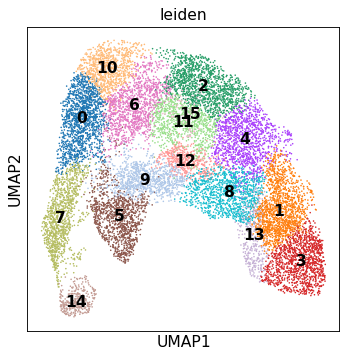

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


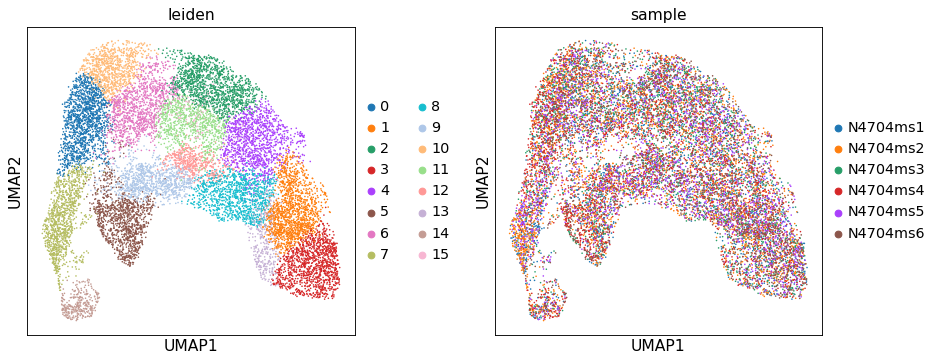

In [5]:
sc.pl.umap(adata, color=["leiden"],wspace=0.3, legend_loc ='on data')
sc.pl.umap(adata, color=["leiden", "sample"],wspace=0.3)

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


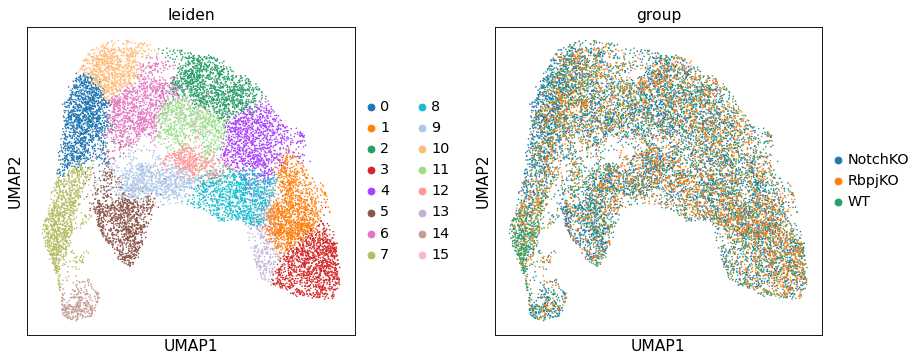

In [6]:
sc.pl.umap(adata, color=["leiden", "group"],wspace=0.3)
#for g in np.unique(adata.obs.group):
#    sc.pl.umap(adata[adata.obs["group"] == g], color=["leiden", "group"],wspace=0.3)

##  number of cells per cluster 

In [7]:
pd.set_option('display.max_columns', 35)
pd.set_option('display.max_rows', None)
adata.obs['leiden'].value_counts()
groups = adata.obs.groupby(["leiden","sample"]).count()["batch"]
#print(groups)

In [8]:
df_counts = pd.DataFrame(adata.obs.groupby(["leiden", "sample"]).count()["batch"])
df_counts.reset_index(inplace=True)
df_counts["batch"] = pd.to_numeric(df_counts["batch"])
df_counts = df_counts.pivot_table(index='leiden',columns='sample')
df_counts.columns = df_counts.columns.get_level_values(1)
df_counts

sample,N4704ms1,N4704ms2,N4704ms3,N4704ms4,N4704ms5,N4704ms6
leiden,,,,,,
0,193,388,178,365,175,145
1,200,292,169,241,234,235
2,205,249,253,197,183,196
3,202,227,157,178,204,253
4,209,237,171,180,180,177
5,164,253,130,303,107,152
6,187,245,183,173,147,172
7,252,386,69,116,193,75
8,145,222,149,181,216,174


N4704ms1
N4704ms2
N4704ms3
N4704ms4
N4704ms5
N4704ms6


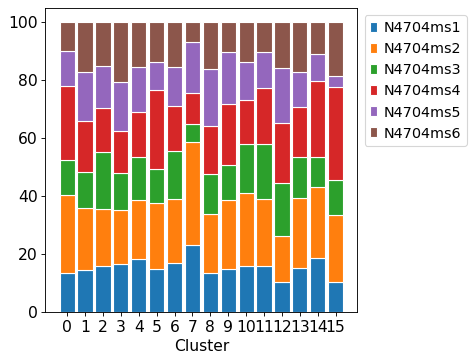

In [9]:
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib.colors as colors
color_list = list(colors.TABLEAU_COLORS.values())

# from raw value to percentage
total =  list(df_counts.sum(axis=1))
barWidth = 0.85
names = list(df_counts.index)

bottom = []
#axes.set_prop_cycle(color=colors)
for index, col in enumerate(df_counts.columns):
    print(col)
    bar = [i / j * 100 for i,j in zip(df_counts[col], total)]
    if index == 0:
        plt.bar(list(range(0, len(names))), bar,color=color_list[index], edgecolor='white', width=barWidth, label=col)
        bottom=bar
    else:
        plt.bar(list(range(0, len(names))), bar,color=color_list[index], edgecolor='white', 
                width=barWidth, label=col,bottom=bottom)
        bottom = [i+j for i,j in zip(bottom, bar)]
        
# Custom x axis
plt.xticks(list(range(0, len(names))), names)
plt.xlabel("Cluster")
 
# Add a legend
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)

# Show graphic
plt.grid(visible=False)
plt.show()

# Unsupervised Markergene identification

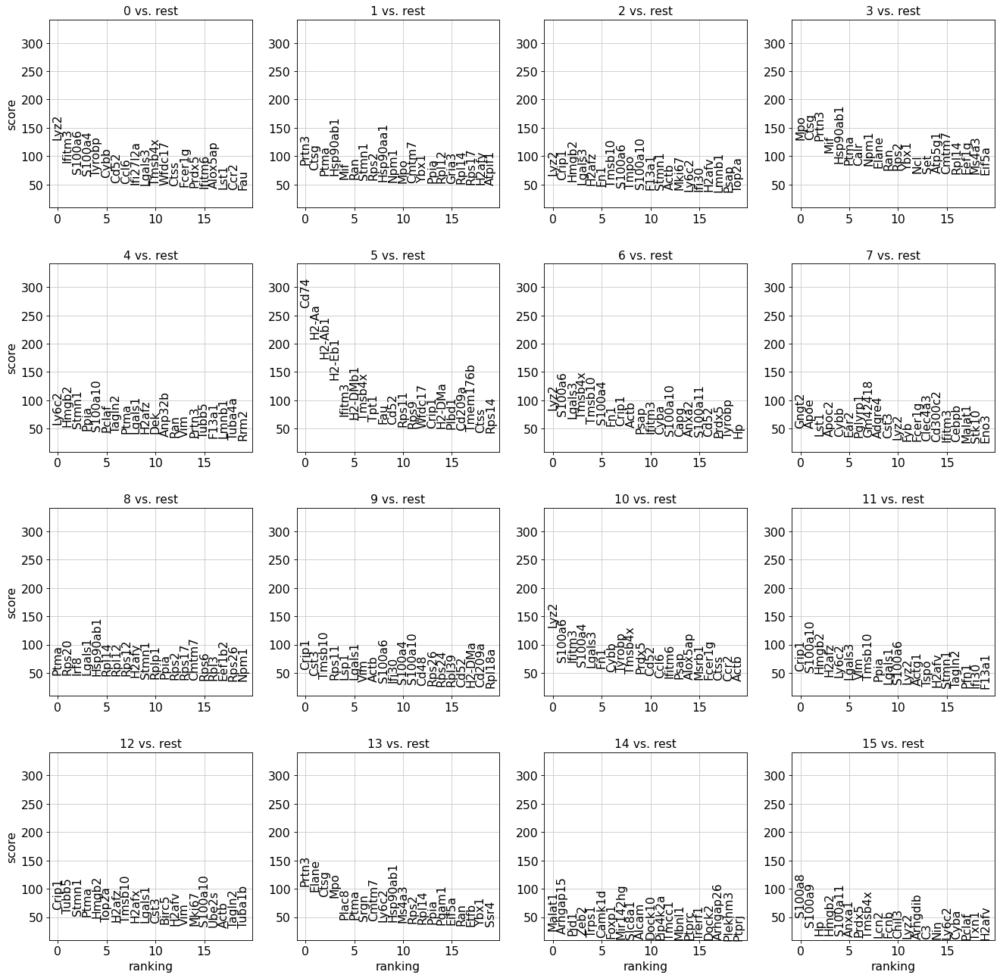

In [10]:
#Calculate marker genes
adata.uns['log1p']['base'] = None # don't know why but looses this if saved.. 
sc.tl.rank_genes_groups(adata, groupby='leiden')
sc.pl.rank_genes_groups(adata, fontsize=14)

In [11]:
#show top 20 ranked genes per cluster
pd.set_option('display.max_columns', 35)
#pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20).to_csv("./results/automatic_marker_calcualtion.csv")
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,Lyz2,Prtn3,Lyz2,Mpo,Ly6c2,Cd74,Lyz2,Gngt2,Ptma,Crip1,Lyz2,Crip1,Crip1,Prtn3,Malat1,S100a8
1,Ifitm3,Ctsg,Crip1,Ctsg,Hmgb2,H2-Aa,S100a6,Apoe,Rps20,Cst3,S100a6,S100a10,Tubb5,Elane,Arhgap15,S100a9
2,S100a6,Ptma,Hmgb2,Prtn3,Stmn1,H2-Ab1,Lgals3,Lst1,Irf8,Tmsb10,Ifitm3,Hmgb2,Stmn1,Ctsg,Pid1,Hp
3,S100a4,Hsp90ab1,Lgals3,Mif,Ppia,H2-Eb1,Tmsb4x,Apoc2,Lgals1,Rps11,S100a4,H2afz,Ptma,Mpo,Zeb2,Hmgb2
4,Tyrobp,Mif,H2afz,Hsp90ab1,S100a10,Ifitm3,Tmsb10,Cybb,Hsp90ab1,Lsp1,Lgals3,Ly6c2,Hmgb2,Plac8,Trps1,S100a11
5,Cybb,Ran,Fn1,Ptma,Pclaf,H2-DMb1,S100a4,Ear2,Rpl14,Lgals1,Fn1,Lgals3,Top2a,Ptma,Camk1d,Anxa1
6,Cd52,Stmn1,Tmsb10,Calr,Tagln2,Tmsb4x,Fn1,Pglyrp1,Rpl12,Vim,Cybb,Vim,H2afz,Srgn,Foxp1,Prdx5
7,Ccl6,Rps2,S100a6,Npm1,Ptma,Tpt1,Crip1,Gm42418,Rps12,Actb,Tyrobp,Tmsb10,Tmsb10,Cmtm7,Mir142hg,Tmsb4x
8,Ifi27l2a,Hsp90aa1,Tmpo,Elane,Lgals1,Fau,Actb,Adgre4,H2afy,S100a6,Tmsb4x,Ppia,H2afx,Ly6c2,Slc8a1,Lcn2
9,Lgals3,Npm1,S100a10,Ran,H2afz,Cd52,Psap,Cst3,Stmn1,Ifi30,Prdx5,Lgals1,Lgals1,Hsp90ab1,Alcam,Fcnb


In [12]:
#Export calculated Markers (DGE)
result = adata.uns['rank_genes_groups']
cluster = result['names'].dtype.names
result
for c in cluster:
    df = pd.DataFrame({key: result[key][c]
    for key in ['names','logfoldchanges','pvals','pvals_adj']})
    #df.to_csv(wd+'/results/bonemarrow/Markergenes_combined_'+c+".csv")

## UMAPs of top5 genes (Figure S6)

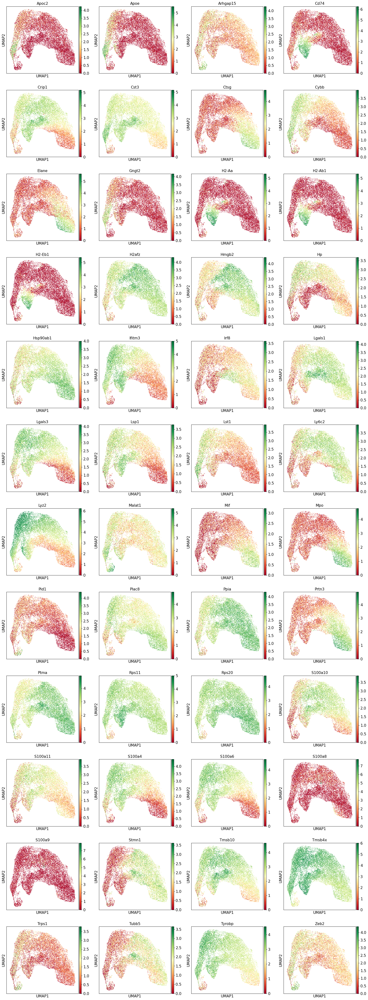

In [13]:
sc.pl.umap(adata, 
           color= np.unique(pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5).stack().tolist()),
           ncols=4, use_raw=True, cmap= "RdYlGn")

## UMAP of known markers (Figure S6)

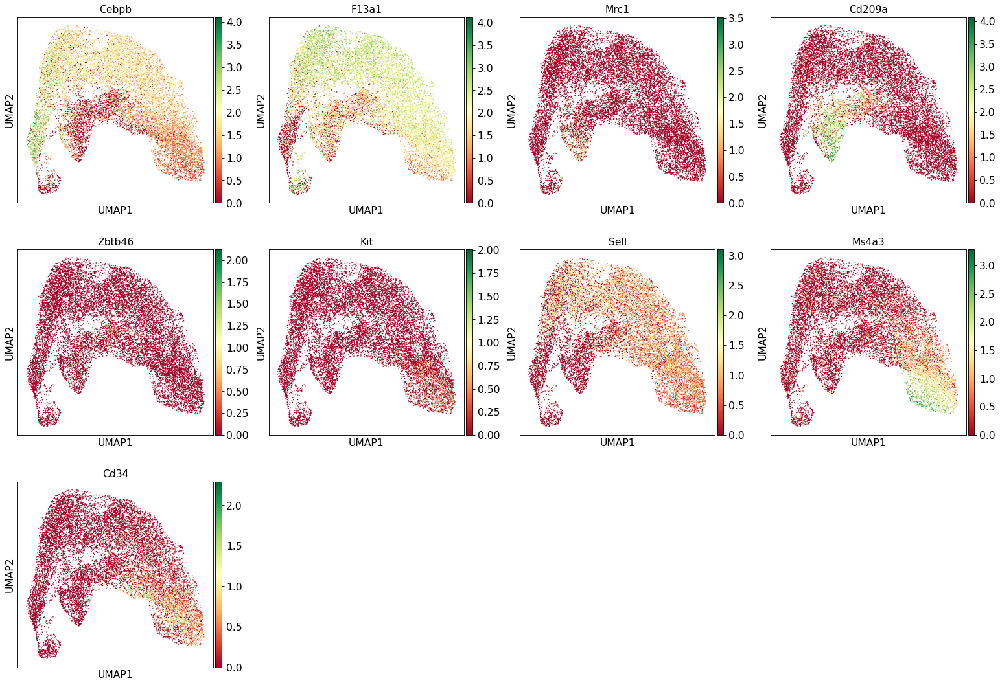

In [14]:
sc.pl.umap(adata, 
           color= ["Cebpb","F13a1","Mrc1","Cd209a","Zbtb46","Kit","Sell","Ms4a3","Cd34"],
           ncols=4, use_raw=True, cmap= "RdYlGn")

# Marker for Annotation

In [15]:
markers= {
    "BM_HSC": ["Hlf","Cd34","Car2","Lmo2","Ifitm1"], #1
    "BM_CLP": ["Dntt","Sox4","Il12a","Arpp21","Satb1","Lck"], #2
    "BM_CMP": ["Cd34","Kit","Flt3"],#3
    "BM_MDP": ["Mpo","Ctsg","Prtn3","Cd34","Kit"],
    "BM_CDP": ["Cd34","Flt3","Csf1r","Ly6c2","Kit","Fcgr3"],
    "BM_GMP/GP": ["Fcgr3","Kit","Cd34","Ms4a3"],
    "BM_cMoP": ["Kit","Cd34","Elane","Prtn3","Ly6c2","Ms4a3"],
    "BM/Spl_Pre-Mono": ["Fcgr3","Ly6c2","Sell","Cxcr4","Ass1"],
    "BM/Spl_GC-Mono": ["Chil3","Cd84","Cd177","F13a1","Lyz2"],
    "BM/Spl_nonDCGC-Mono": ["Lyz2","Hp","Fn1","F13a1"],
    "BM/Spl_DC-Mono": ["Slamf7","H2-Aa","Tmem176b"],
    "BM/Spl_Cxcl10-Mono": ["Cxcl10","Ifit3","Isg15","Ifit2"],
    "BM/Spl_Lo-Mono": ["Apoe","Gngt2","Cebpb","Cybb","Adgre4"],
    "BM_pre-B": ["Ebf1","Vpreb3","Cd79a","Myl10","Vpreb1","Dntt","Atp1b3"],
    "BM/Spl_prolif_pDC": ["Ly6d","Siglech","Cox6a2","Top2a","Mki67","Spc24","Birc5"],
    "BM/Spl_pDC": ["Siglech","Cox6a2","Ly6d","Ctsl","Dnajc7"],
    "BM_pre-DC1": ["Id2","Aif1","H2-Ab1","Cd74"],
    "Spl_pre-DC1": ["Id2","Aif1","H2-Ab1","Cd74","Cst3"],
    "BM/Spl_DC1": ["Id2","Aif1","Naaa","Cst3","Ppt1"],
    "BM/Spl_pre-DC2": ["Cd7","Klf4","S100a6","Ly6c2","Fcgrt"],
    "BM/Spl_DC2": ["Ffar2","Rgs2","Ltb","Cd7","H2-DMb2"],
    "BM_pro-DC3": ["Ifitm3","Lgals3","S100a4","Cd209a","Cd74","H2-Eb1","H2-Ab1"],
    "Spl_pro-DC3": ["Ifitm3","Lgals3","S100a4","Wfdc17","Ccl9","Ifitm2"],
    "BM/Spl_DC3": ["H2-Eb1","H2-Aa","H2-Ab1","Tmem176a","Skint3"],
    "BM/Spl_CCR7+DC": ["Ccr7","Ccl5","Cd63","Tmem123","Fabp5","Tmem176a"],
    "BM_prolif_DC": ["Mki67","Ube2c","Cenpa","Stmn1"],
    "Spl_prolif_DC": ["Mki67","Ube2c","Cenpa","Stmn1","Ppp1r14a","H2-DMb2","Rgs2"],
    "BM/Spl_RPM": ["Spic","Vcam1","Hmox1","Slc40a1","Axl","Mertk"],
    "BM/Spl_Granulocytes": ["S100a9","S100a8","Ngp","Camp","Lcn2","Ltf"] #29
}

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


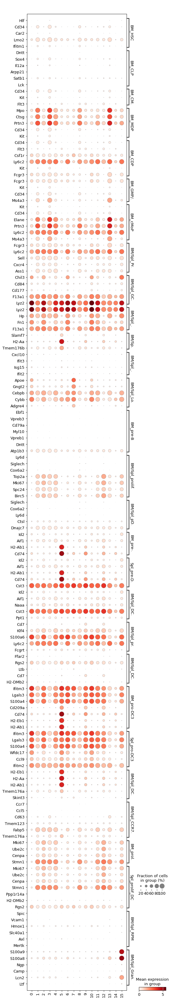

In [16]:
sc.pl.dotplot(adata, markers, groupby="leiden", swap_axes=True)

# Annotation (1. version)

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


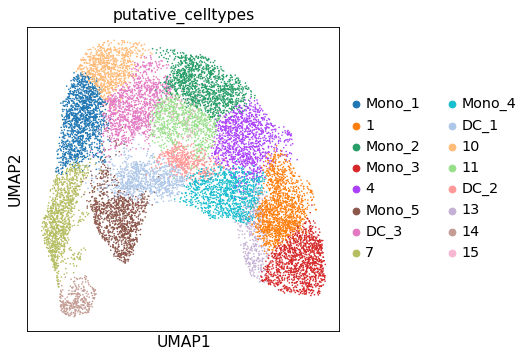

In [17]:
adata.obs["putative_celltypes"] = adata.obs.leiden
adata.rename_categories('putative_celltypes', ['Mono_1','1','Mono_2',"Mono_3","4","Mono_5","DC_3",
                                               "7","Mono_4","DC_1","10",
                                               "11","DC_2","13","14","15"])

sc.pl.umap(adata, color="putative_celltypes")

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


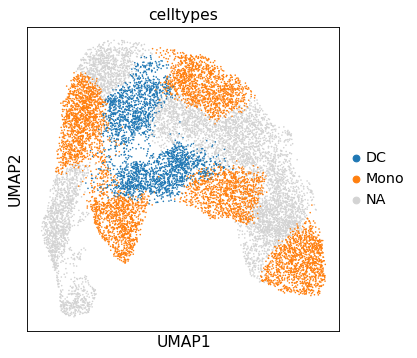

In [18]:
old_to_new = dict(
    Mono_1='Mono',
    Mono_2='Mono',
    Mono_3='Mono',
    Mono_4='Mono',
    Mono_5='Mono',
    DC_1='DC',
    DC_2='DC',
    DC_3='DC',
)
adata.obs['celltypes'] = (
    adata.obs['putative_celltypes']
    .map(old_to_new)
    .astype('category')
)

sc.pl.umap(adata, color="celltypes")

## Recluster the "NA"-Celltypes

In [19]:
adata_recluster = adata.copy()
adata_recluster.obs.celltype = adata_recluster.obs.celltypes.astype(str)
adata_recluster = adata_recluster[adata_recluster.obs.celltype == "nan"]

/tmp/ipykernel_3925948/83119748.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  adata_recluster.obs.celltype = adata_recluster.obs.celltypes.astype(str)


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/dzl_bioinf/exec/minicon

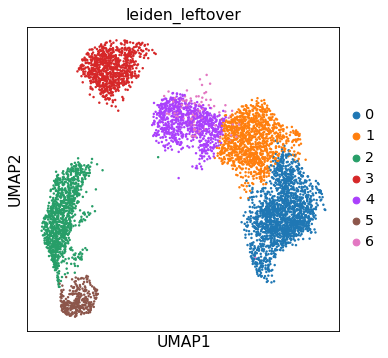

In [20]:
sc.pp.neighbors(adata_recluster)
sc.tl.leiden(adata_recluster, key_added="leiden_leftover", resolution=0.3)
sc.pl.umap(adata_recluster, color="leiden_leftover")

### Markergenes

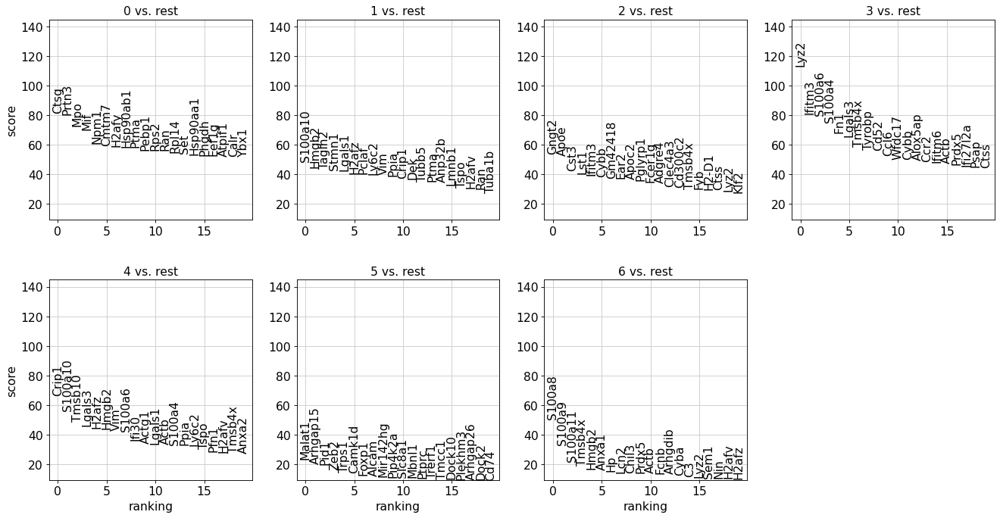

In [21]:
#Calculate marker genes

adata_recluster.uns['log1p']['base'] = None # don't know why but looses this if saved.. 
sc.tl.rank_genes_groups(adata_recluster, groupby='leiden_leftover')
sc.pl.rank_genes_groups(adata_recluster, fontsize=14)

###  Dotplot known markers

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


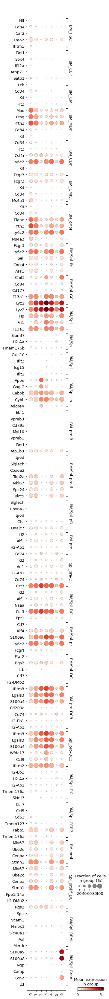

In [22]:
markers= {
    "BM_HSC": ["Hlf","Cd34","Car2","Lmo2","Ifitm1"], #1
    "BM_CLP": ["Dntt","Sox4","Il12a","Arpp21","Satb1","Lck"], #2
    "BM_CMP": ["Cd34","Kit","Flt3"],#3
    "BM_MDP": ["Mpo","Ctsg","Prtn3","Cd34","Kit"],
    "BM_CDP": ["Cd34","Flt3","Csf1r","Ly6c2","Kit","Fcgr3"],
    "BM_GMP/GP": ["Fcgr3","Kit","Cd34","Ms4a3"],
    "BM_cMoP": ["Kit","Cd34","Elane","Prtn3","Ly6c2","Ms4a3"],
    "BM/Spl_Pre-Mono": ["Fcgr3","Ly6c2","Sell","Cxcr4","Ass1"],
    "BM/Spl_GC-Mono": ["Chil3","Cd84","Cd177","F13a1","Lyz2"],
    "BM/Spl_nonDCGC-Mono": ["Lyz2","Hp","Fn1","F13a1"],
    "BM/Spl_DC-Mono": ["Slamf7","H2-Aa","Tmem176b"],
    "BM/Spl_Cxcl10-Mono": ["Cxcl10","Ifit3","Isg15","Ifit2"],
    "BM/Spl_Lo-Mono": ["Apoe","Gngt2","Cebpb","Cybb","Adgre4"],
    "BM_pre-B": ["Ebf1","Vpreb3","Cd79a","Myl10","Vpreb1","Dntt","Atp1b3"],
    "BM/Spl_prolif_pDC": ["Ly6d","Siglech","Cox6a2","Top2a","Mki67","Spc24","Birc5"],
    "BM/Spl_pDC": ["Siglech","Cox6a2","Ly6d","Ctsl","Dnajc7"],
    "BM_pre-DC1": ["Id2","Aif1","H2-Ab1","Cd74"],
    "Spl_pre-DC1": ["Id2","Aif1","H2-Ab1","Cd74","Cst3"],
    "BM/Spl_DC1": ["Id2","Aif1","Naaa","Cst3","Ppt1"],
    "BM/Spl_pre-DC2": ["Cd7","Klf4","S100a6","Ly6c2","Fcgrt"],
    "BM/Spl_DC2": ["Ffar2","Rgs2","Ltb","Cd7","H2-DMb2"],
    "BM_pro-DC3": ["Ifitm3","Lgals3","S100a4","Cd209a","Cd74","H2-Eb1","H2-Ab1"],
    "Spl_pro-DC3": ["Ifitm3","Lgals3","S100a4","Wfdc17","Ccl9","Ifitm2"],
    "BM/Spl_DC3": ["H2-Eb1","H2-Aa","H2-Ab1","Tmem176a","Skint3"],
    "BM/Spl_CCR7+DC": ["Ccr7","Ccl5","Cd63","Tmem123","Fabp5","Tmem176a"],
    "BM_prolif_DC": ["Mki67","Ube2c","Cenpa","Stmn1"],
    "Spl_prolif_DC": ["Mki67","Ube2c","Cenpa","Stmn1","Ppp1r14a","H2-DMb2","Rgs2"],
    "BM/Spl_RPM": ["Spic","Vcam1","Hmox1","Slc40a1","Axl","Mertk"],
    "BM/Spl_Granulocytes": ["S100a9","S100a8","Ngp","Camp","Lcn2","Ltf"] #29
}
sc.pl.dotplot(adata_recluster, markers, groupby="leiden_leftover", swap_axes=True)

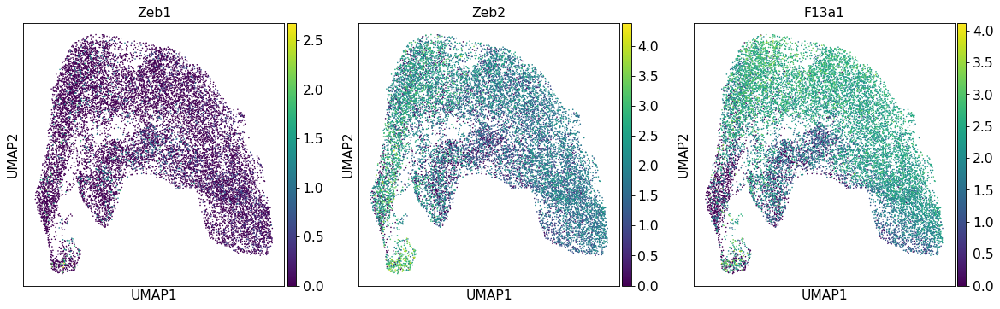

In [23]:
sc.pl.umap(adata, color=["Zeb1","Zeb2","F13a1"])

In [24]:
adata.obs = pd.merge(adata.obs, adata_recluster.obs["leiden_leftover"],
                     left_index=True, right_index=True, how="left")

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


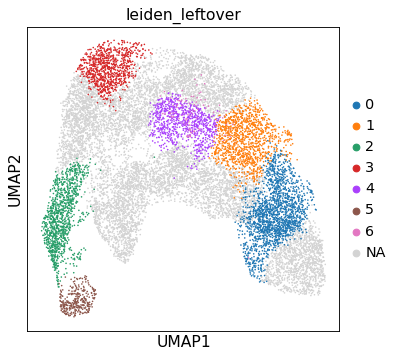

In [25]:
sc.pl.umap(adata, color="leiden_leftover")

# Annotation final

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


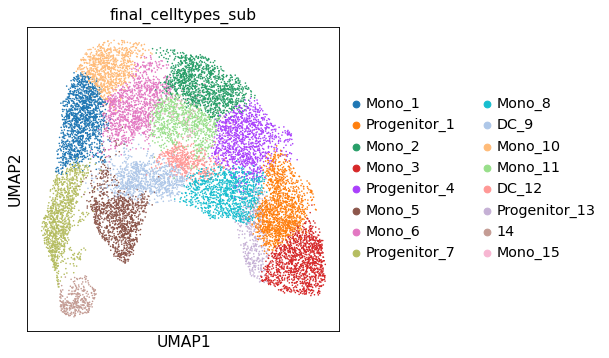

In [26]:
adata.obs["final_celltypes_sub"] = adata.obs.leiden
adata.rename_categories('final_celltypes_sub', ['Mono_1','Progenitor_1','Mono_2',"Mono_3","Progenitor_4","Mono_5","Mono_6",
                                               "Progenitor_7","Mono_8","DC_9","Mono_10",
                                               "Mono_11","DC_12","Progenitor_13","14","Mono_15"])

sc.pl.umap(adata, color="final_celltypes_sub")

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


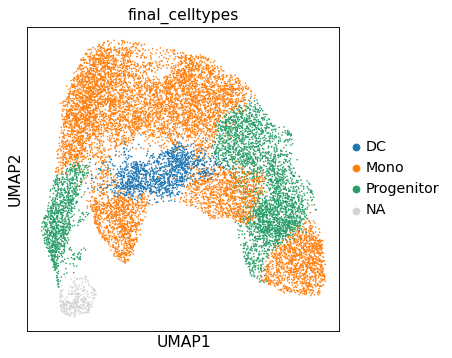

In [27]:
old_to_new = dict(
    Mono_1='Mono',
    Mono_2='Mono',
    Mono_3='Mono',
    Mono_5='Mono',
    Mono_6='Mono',
    Mono_8='Mono',
    Mono_10='Mono',
    Mono_11='Mono',
    Mono_15='Mono',
    DC_9='DC',
    DC_12='DC',
    Progenitor_1="Progenitor",
    Progenitor_4="Progenitor",
    Progenitor_7="Progenitor",
    Progenitor_13="Progenitor"
)
adata.obs['final_celltypes'] = (
    adata.obs['final_celltypes_sub']
    .map(old_to_new)
    .astype('category')
)

sc.pl.umap(adata, color="final_celltypes")

## subcluster mono (Figure 5 A+B+C)

In [28]:
adata_mono = adata.copy()
adata_mono.obs.celltype = adata_mono.obs.final_celltypes.astype(str)
adata_mono = adata_mono[adata_mono.obs.final_celltypes == "Mono"]

/tmp/ipykernel_3925948/665292069.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  adata_mono.obs.celltype = adata_mono.obs.final_celltypes.astype(str)


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


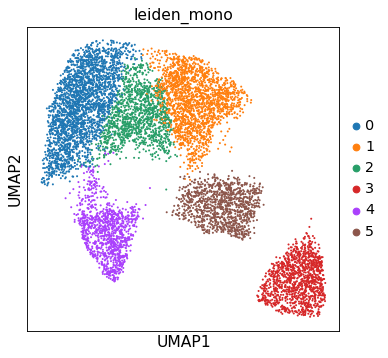

In [29]:
sc.pp.neighbors(adata_mono)
sc.tl.leiden(adata_mono, key_added="leiden_mono", resolution=0.3)
sc.pl.umap(adata_mono, color="leiden_mono")

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


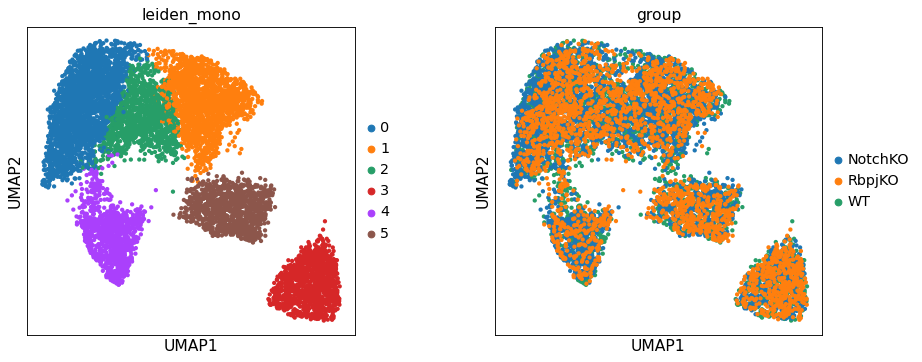

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


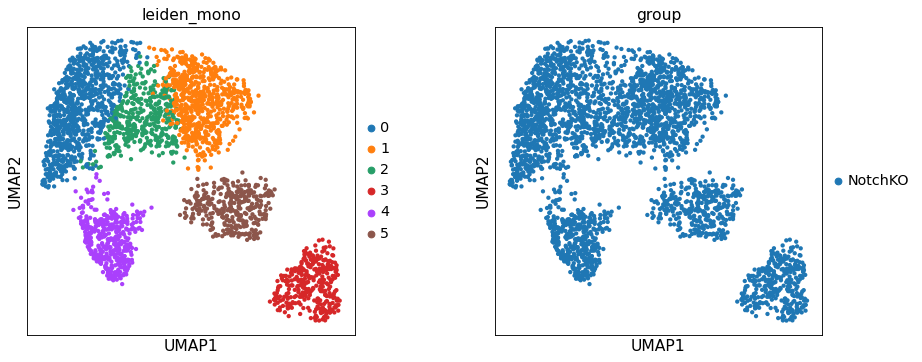

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


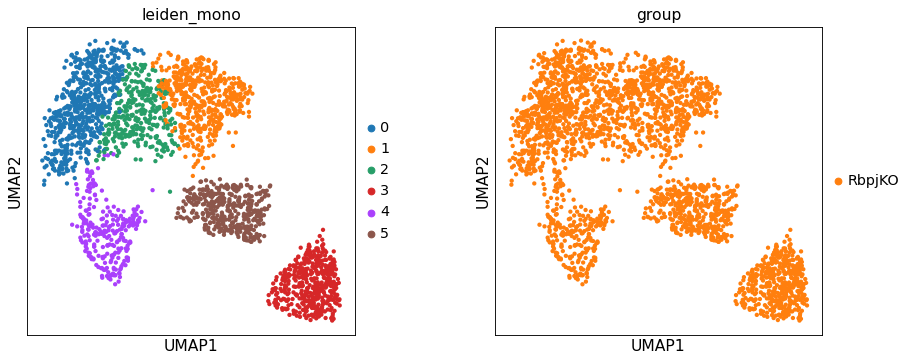

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


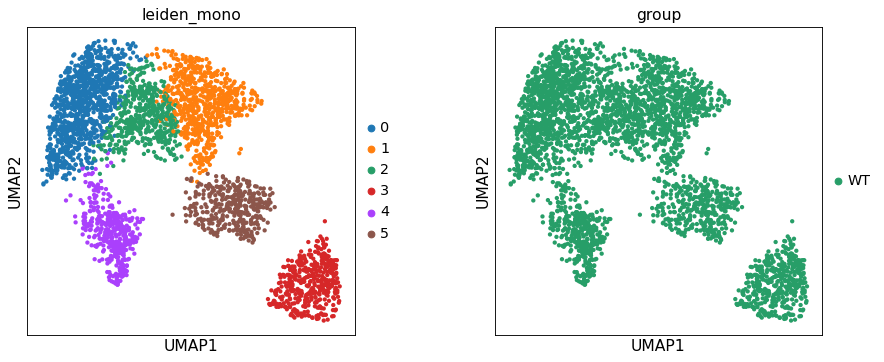

In [30]:
sc.pl.umap(adata_mono, color=["leiden_mono", "group"],wspace=0.3, size=60)

for g in np.unique(adata_mono.obs.group):
    sc.pl.umap(adata_mono[adata_mono.obs["group"] == g], color=["leiden_mono", "group"],
               wspace=0.3, size=60)

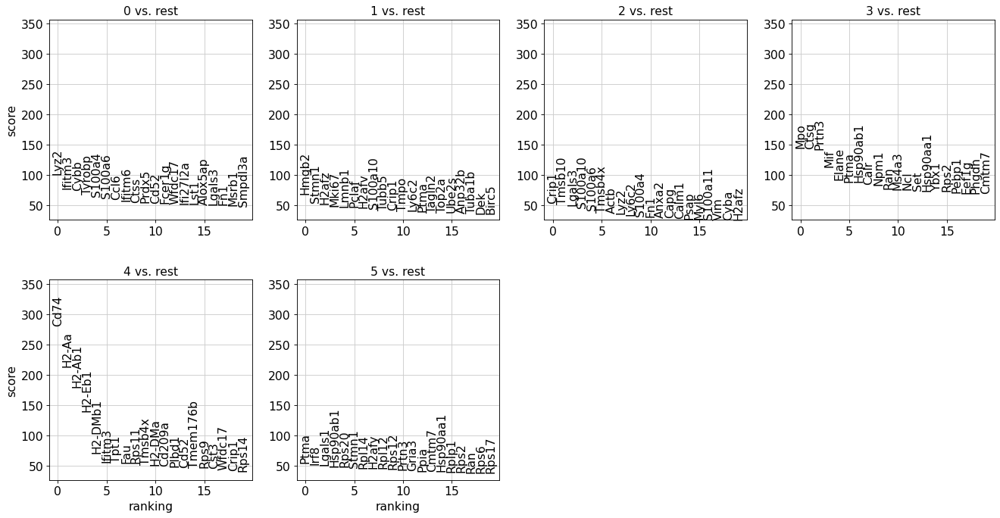

In [31]:
#Calculate marker genes
adata_mono.uns['log1p']['base'] = None # don't know why but looses this if saved.. 
sc.tl.rank_genes_groups(adata_mono, groupby='leiden_mono')
sc.pl.rank_genes_groups(adata_mono, fontsize=14)

In [32]:
pd.set_option('display.max_columns', 35)
pd.set_option('display.max_rows', None)
adata_mono.obs['leiden_mono'].value_counts()
groups = adata_mono.obs.groupby(["leiden_mono","group"]).count()["sample"]

df_counts = pd.DataFrame(adata_mono.obs.groupby(["leiden_mono", "group"]).count()["batch"])
df_counts.reset_index(inplace=True)
df_counts["batch"] = pd.to_numeric(df_counts["batch"])
df_counts = df_counts.pivot_table(index='leiden_mono',columns='group')
df_counts.columns = df_counts.columns.get_level_values(1)
df_counts

group,NotchKO,RbpjKO,WT
leiden_mono,,,
0,895,626,1036
1,680,510,658
2,413,325,486
3,335,457,429
4,432,260,415
5,331,390,370


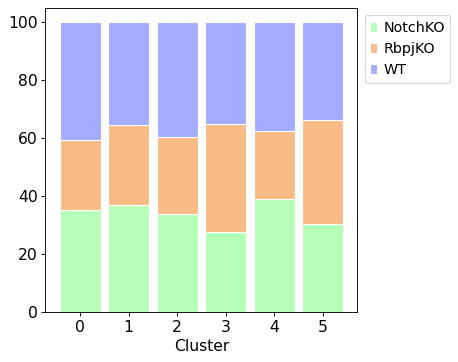

In [33]:
import seaborn as sns
import matplotlib.patches as mpatches
# from raw value to percentage
total =  [i+j+k for i,j,k in zip(df_counts['NotchKO'], df_counts['RbpjKO'], df_counts['WT'])]
alum_bar = [i / j * 100 for i,j in zip(df_counts['NotchKO'], total)]
ova_bar = [i / j * 100 for i,j in zip(df_counts['RbpjKO'], total)]
tol_bar = [i / j * 100 for i,j in zip(df_counts['WT'], total)]

# plot
barWidth = 0.85
names = list(df_counts.index)
# Create green Bars
plt.bar(list(range(0, len(names))), alum_bar, color='#b5ffb9', edgecolor='white', width=barWidth, label="NotchKO")
# Create orange Bars
plt.bar(list(range(0, len(names))), ova_bar, bottom=alum_bar, color='#f9bc86',
        edgecolor='white', width=barWidth, label="RbpjKO")
# Create blue Bars
plt.bar(list(range(0, len(names))), tol_bar, bottom=[i+j for i,j in zip(alum_bar, ova_bar)], 
        color='#a3acff', edgecolor='white', width=barWidth, label="WT")
 
# Custom x axis
plt.xticks(list(range(0, len(names))), names)
plt.xlabel("Cluster")
 
# Add a legend
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)

# Show graphic
plt.grid(visible=False)
plt.show()

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


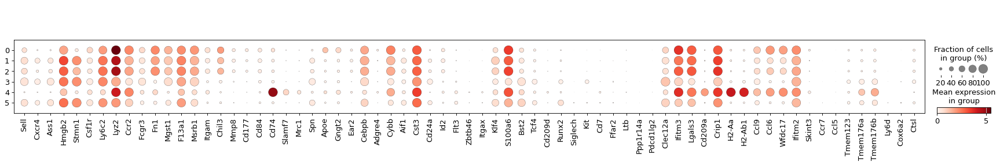

In [34]:
sc.pl.dotplot(adata_mono, var_names=["Sell","Cxcr4","Ass1","Hmgb2","Stmn1","Csf1r","Ly6c2","Lyz2","Ccr2","Fcgr3",
                                "Fn1","Mgst1","F13a1","Msrb1","Itgam","Chil3","Mmp8","Cd177","Cd84","Cd74",
                                "Slamf7","Mrc1","Spn","Apoe","Gngt2","Ear2","Cebpb","Adgre4","Cybb","Aif1",
                                "Cst3","Cd24a","Id2","Flt3","Zbtb46","Itgax","Klf4","S100a6","Bst2","Tcf4",
                                "Cd209d","Runx2","Siglech","Kit","Cd7","Ffar2","Ltb","Ppp1r14a","Pdcd1lg2",
                                "Clec12a","Ifitm3","Lgals3","Cd209a","Crip1","H2-Aa","H2-Ab1","Ccl9","Ccl6","Wfdc17",
                                "Ifitm2","Skint3","Ccr7","Ccl5","Tmem123","Tmem176a","Tmem176b","Ly6d","Cox6a2","Ctsl"],
             groupby="leiden_mono",
             categories_order =['0', '1', '2', '3','4', '5', ])

### Cluster 3  marker

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


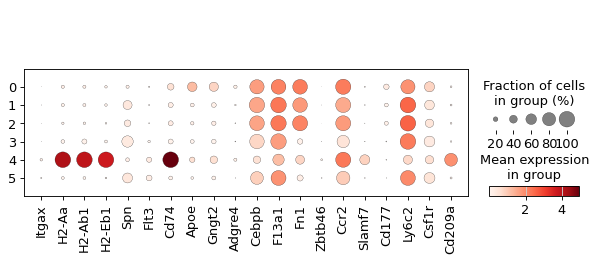

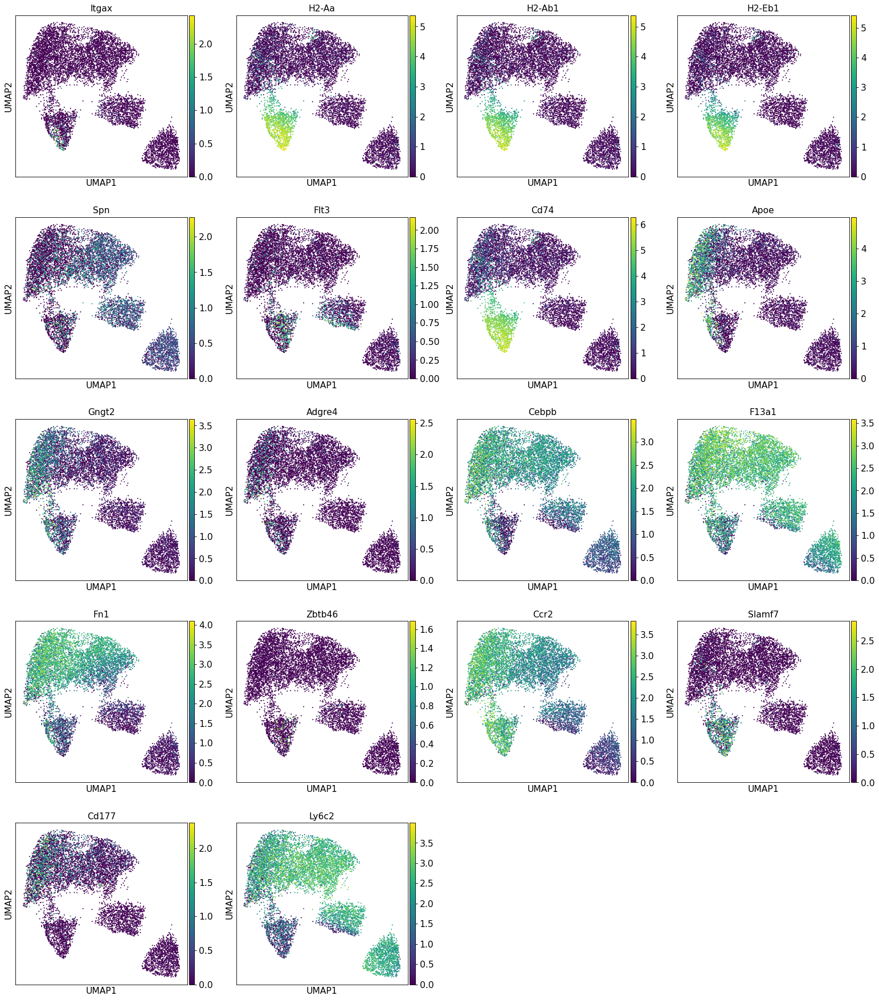

In [35]:
markers = ["Itgax","H2-Aa","H2-Ab1","H2-Eb1","Spn","Flt3","Cd74","Apoe","Gngt2",
           "Adgre4","Cebpb","F13a1","Fn1","Zbtb46","Ccr2","Slamf7","Cd177","Ly6c2"]


sc.pl.dotplot(adata_mono, groupby="leiden_mono", var_names=markers+["Csf1r","Cd209a"])
sc.pl.umap(adata_mono, color=markers)

it looks like there might be a subset in cluster 3 therefore:

### subcluster cluster 3 (Figure 5 E+F+G, S7)

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


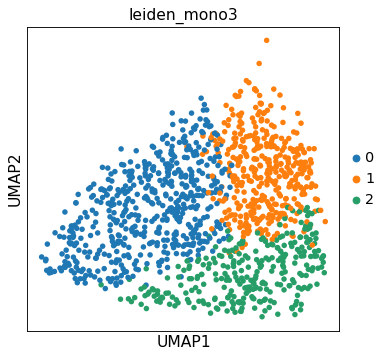

In [36]:
adata_mono3 = adata_mono[adata_mono.obs["leiden_mono"] == "3"]
sc.pp.neighbors(adata_mono3)
sc.tl.leiden(adata_mono3, key_added="leiden_mono3", resolution=0.3)
sc.pl.umap(adata_mono3, color="leiden_mono3")

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


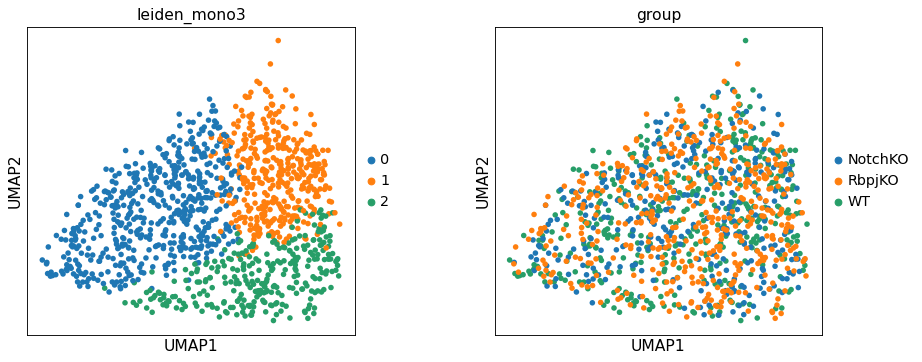

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


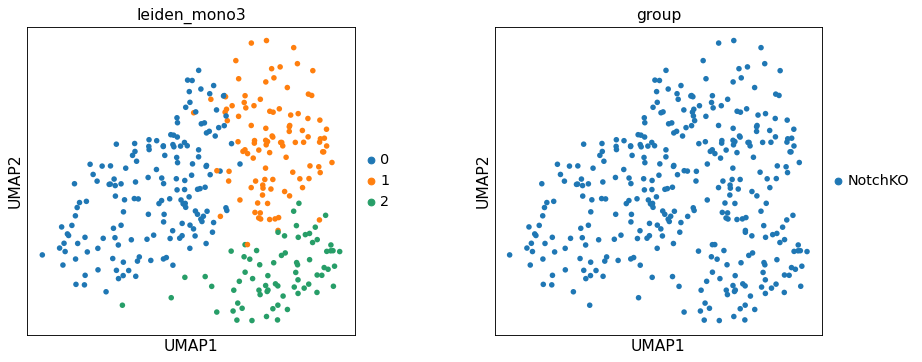

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


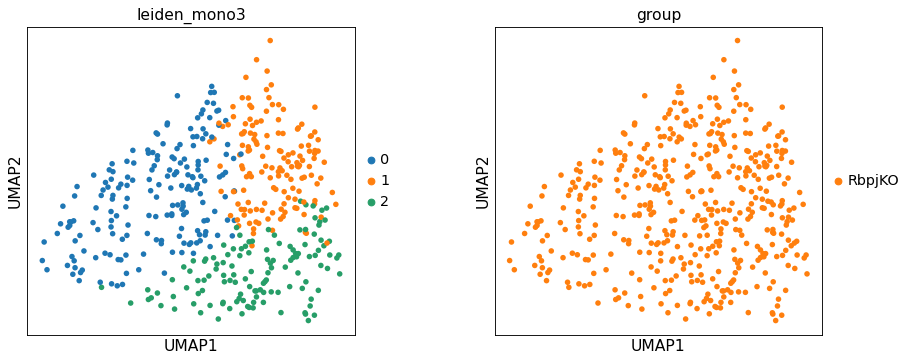

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


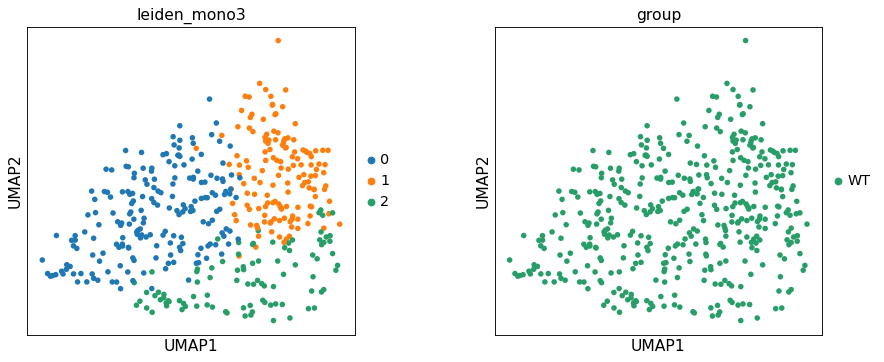

In [37]:
sc.pl.umap(adata_mono3, color=["leiden_mono3", "group"],wspace=0.3, size=100)

for g in np.unique(adata_mono3.obs.group):
    sc.pl.umap(adata_mono3[adata_mono3.obs["group"] == g], color=["leiden_mono3", "group"],
               wspace=0.3,size=100)

In [38]:
pd.set_option('display.max_columns', 35)
pd.set_option('display.max_rows', None)
adata_mono3.obs['leiden_mono3'].value_counts()
groups = adata_mono3.obs.groupby(["leiden_mono3","group"]).count()["sample"]

df_counts = pd.DataFrame(adata_mono3.obs.groupby(["leiden_mono3", "group"]).count()["batch"])
df_counts.reset_index(inplace=True)
df_counts["batch"] = pd.to_numeric(df_counts["batch"])
df_counts = df_counts.pivot_table(index='leiden_mono3',columns='group')
df_counts.columns = df_counts.columns.get_level_values(1)
df_counts

group,NotchKO,RbpjKO,WT
leiden_mono3,,,
0,160,185,193
1,104,146,143
2,71,126,93


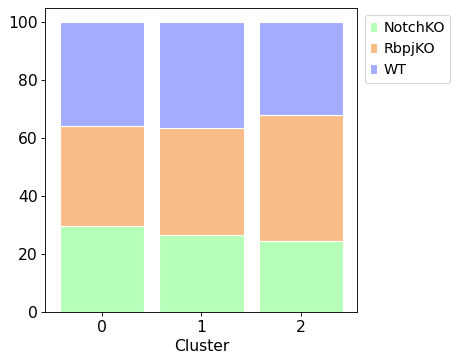

In [39]:
import seaborn as sns
import matplotlib.patches as mpatches
# from raw value to percentage
total =  [i+j+k for i,j,k in zip(df_counts['NotchKO'], df_counts['RbpjKO'], df_counts['WT'])]
alum_bar = [i / j * 100 for i,j in zip(df_counts['NotchKO'], total)]
ova_bar = [i / j * 100 for i,j in zip(df_counts['RbpjKO'], total)]
tol_bar = [i / j * 100 for i,j in zip(df_counts['WT'], total)]

# plot
barWidth = 0.85
names = list(df_counts.index)
# Create green Bars
plt.bar(list(range(0, len(names))), alum_bar, color='#b5ffb9', edgecolor='white', width=barWidth, label="NotchKO")
# Create orange Bars
plt.bar(list(range(0, len(names))), ova_bar, bottom=alum_bar, color='#f9bc86',
        edgecolor='white', width=barWidth, label="RbpjKO")
# Create blue Bars
plt.bar(list(range(0, len(names))), tol_bar, bottom=[i+j for i,j in zip(alum_bar, ova_bar)], 
        color='#a3acff', edgecolor='white', width=barWidth, label="WT")
 
# Custom x axis
plt.xticks(list(range(0, len(names))), names)
plt.xlabel("Cluster")
 
# Add a legend
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)

# Show graphic
plt.grid(visible=False)
plt.show()

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


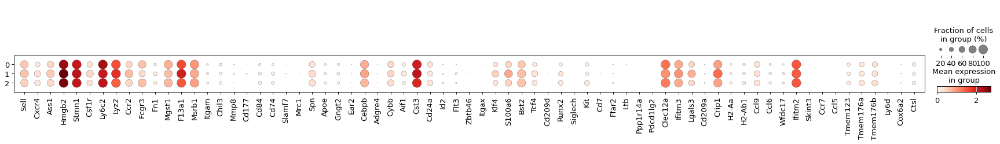

In [40]:
sc.pl.dotplot(adata_mono3, var_names=["Sell","Cxcr4","Ass1","Hmgb2","Stmn1","Csf1r","Ly6c2","Lyz2","Ccr2","Fcgr3",
                                "Fn1","Mgst1","F13a1","Msrb1","Itgam","Chil3","Mmp8","Cd177","Cd84","Cd74",
                                "Slamf7","Mrc1","Spn","Apoe","Gngt2","Ear2","Cebpb","Adgre4","Cybb","Aif1",
                                "Cst3","Cd24a","Id2","Flt3","Zbtb46","Itgax","Klf4","S100a6","Bst2","Tcf4",
                                "Cd209d","Runx2","Siglech","Kit","Cd7","Ffar2","Ltb","Ppp1r14a","Pdcd1lg2",
                                "Clec12a","Ifitm3","Lgals3","Cd209a","Crip1","H2-Aa","H2-Ab1","Ccl9","Ccl6","Wfdc17",
                                "Ifitm2","Skint3","Ccr7","Ccl5","Tmem123","Tmem176a","Tmem176b","Ly6d","Cox6a2","Ctsl"],
             groupby="leiden_mono3")

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA2023/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


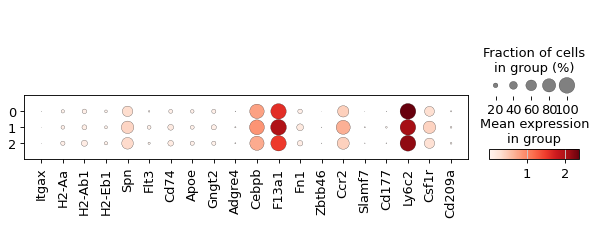

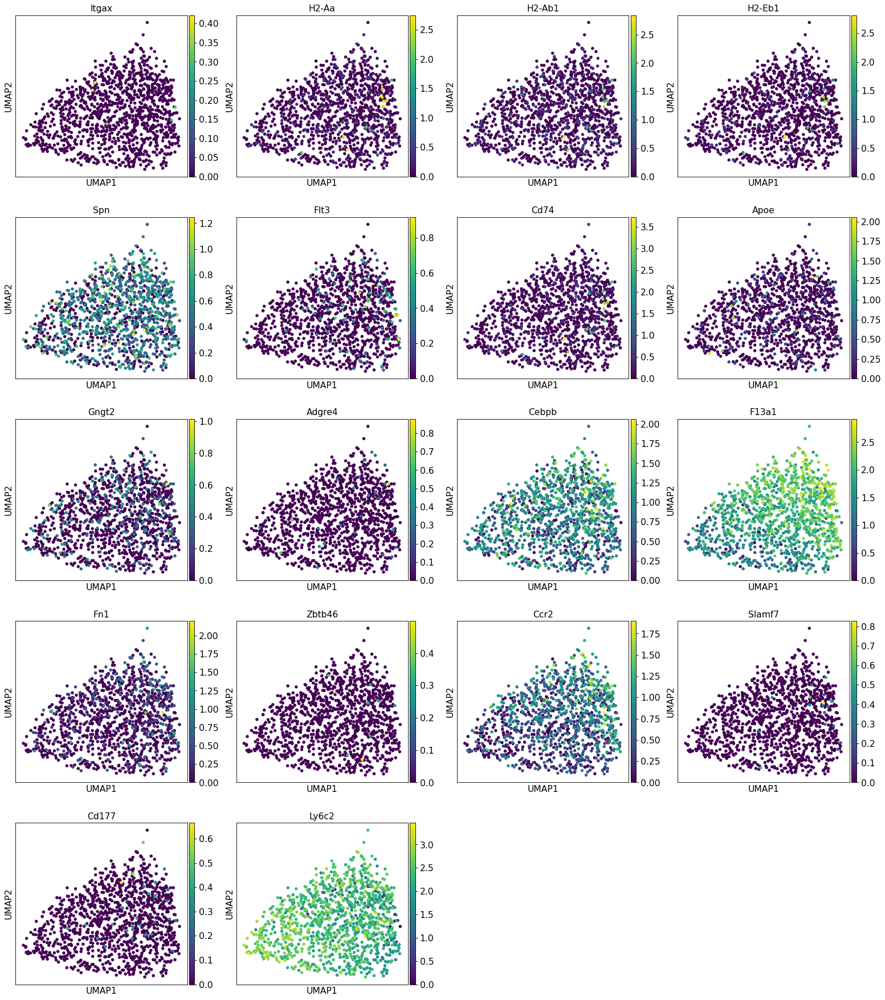

In [41]:
markers = ["Itgax","H2-Aa","H2-Ab1","H2-Eb1","Spn","Flt3","Cd74","Apoe","Gngt2",
           "Adgre4","Cebpb","F13a1","Fn1","Zbtb46","Ccr2","Slamf7","Cd177","Ly6c2"]

sc.pl.dotplot(adata_mono3, groupby="leiden_mono3", var_names=markers+["Csf1r","Cd209a"])
sc.pl.umap(adata_mono3, color=markers)

# Save results

In [42]:
adata.write('./results/CelltypeIdentifcation_20230925_bonemarrow.h5ad' )

In [43]:
%%bash
jupyter nbconvert --to  html_toc CelltypeIdentifcation_BM.ipynb --ExtractOutputPreprocessor.enabled=False
mv CelltypeIdentifcation_BM.html ./results/CelltypeIdentifcation_BM_$(date +%Y%m%d).html 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
[NbConvertApp] WARNING | Config option `kernel_spec_manager_class` not recognized by `NbConvertApp`.
[NbConvertApp] Converting notebook CelltypeIdentifcation_BM.ipynb to html_toc
[NbConvertApp] Writing 21414692 bytes to CelltypeIdentifcation_BM.html
